
## Business Problem

 United Sates of America is an immgration country, which creat ethnic diversity. New York as the econmic center of U.S., because of this unsurpassed ethnic diversity, the restaurant goer will feel that he has died and gone to heaven while in New York City. The infinite numbers of Chinese dishes, flavors, and methods of cooking which make eating Chinese food joyful and exciting. Ss when somone want open a Chinese restaurant business in NYC, which location and neighboerhood is the best?   Using data science to analysis and cluster Chinese food to find the best location is best way for owner, this will save both money and time. We will use data to make the decision on the place that is the most convenient for owner's new business.

With the data, we will see all the Chinese Restaurant in NYC with a Map. Once we have the map, we will make a conclusion for the best new location to open a Chinese Restaurant.

With the business problem well defined the next factors are crucial:

Number of existing Chinese Restaurant in NYC
Number of existing Chinese Restaurant in neighborhood
Population distrubtion in NYC neighborhoods

Data sources where we will extract information: 

To get the map of NYC I will use Wikipedia information and NYC data Json file from previous Lab. 
Chinese Restaurants in NYC from NYC Open Data



In [187]:


import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files


!pip install geocoder
#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!pip install folium
#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
print('Libraries imported.')



Libraries imported.


In [188]:
! pip install stopwords
! pip install wordcloud
import seaborn as sns

In [189]:
df= pd.read_csv("https://data.cityofnewyork.us/api/views/w3z6-mr9h/rows.csv?accessType=DOWNLOAD")
df.head()


,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,VIOLATION CODE,VIOLATION DESCRIPTION,CRITICAL FLAG,SCORE,GRADE,GRADE DATE,RECORD DATE,INSPECTION TYPE
0,50072803,PANDA KITCHEN,Queens,14611,ROCKAWAY BLVD,11436.0,7183223446,Chinese,07/22/2019,Violations were cited in the following area(s).,02G,Cold food item held above 41º F (smoked fish a...,Y,15.0,NaN,NaN,03/21/2020,Cycle Inspection / Initial Inspection
1,50070068,HOT SPACE,Queens,3907,PRINCE ST,11354.0,9292904212,Chinese,11/16/2018,Violations were cited in the following area(s).,09B,Thawing procedures improper.,N,4.0,A,11/16/2018,03/21/2020,Cycle Inspection / Initial Inspection
2,50072943,SHANGHAI ZHEN GONG FU RESTAURANT,Queens,8616,QUEENS BLVD,11373.0,3474749686,Chinese,08/07/2019,Violations were cited in the following area(s).,10I,"Single service item reused, improperly stored,...",N,12.0,A,08/07/2019,03/21/2020,Cycle Inspection / Re-inspection
3,41464273,NO. 1 CHINA GARDEN KITCHEN,Bronx,1349,EDWARD L GRANT HIGHWAY,10452.0,7182935056,Chinese,03/28/2019,Violations were cited in the following area(s).,04K,Evidence of rats or live rats present in facil...,Y,24.0,NaN,NaN,03/21/2020,Cycle Inspection / Initial Inspection
4,50072980,OK LAH!,Queens,13620,38TH AVE,11354.0,9176280180,Chinese,10/22/2019,Violations were cited in the following area(s).,04M,Live roaches present in facility's food and/or...,Y,29.0,NaN,NaN,03/21/2020,Cycle Inspection / Initial Inspection


In [190]:
df=df[['DBA', 'BORO']]
df.rename(columns = {'DBA':'Name', 'BORO':'Borough'}, inplace = True)  
df

,Name,Borough
0,PANDA KITCHEN,Queens
1,HOT SPACE,Queens
2,SHANGHAI ZHEN GONG FU RESTAURANT,Queens
3,NO. 1 CHINA GARDEN KITCHEN,Bronx
4,OK LAH!,Queens
5,HAO NOODLE,Manhattan
6,DOUBLE DRAGON 88,Manhattan
7,HANA NOODLE STATION,Brooklyn
8,UP UP RESTAURANT,Brooklyn
9,SHUN LEE,Manhattan


In [191]:
df_count = df["Borough"].value_counts().rename_axis('Country').reset_index(name='count')
df_count


,Country,count
0,Queens,13268
1,Brooklyn,12772
2,Manhattan,10927
3,Bronx,4279
4,Staten Island,1205


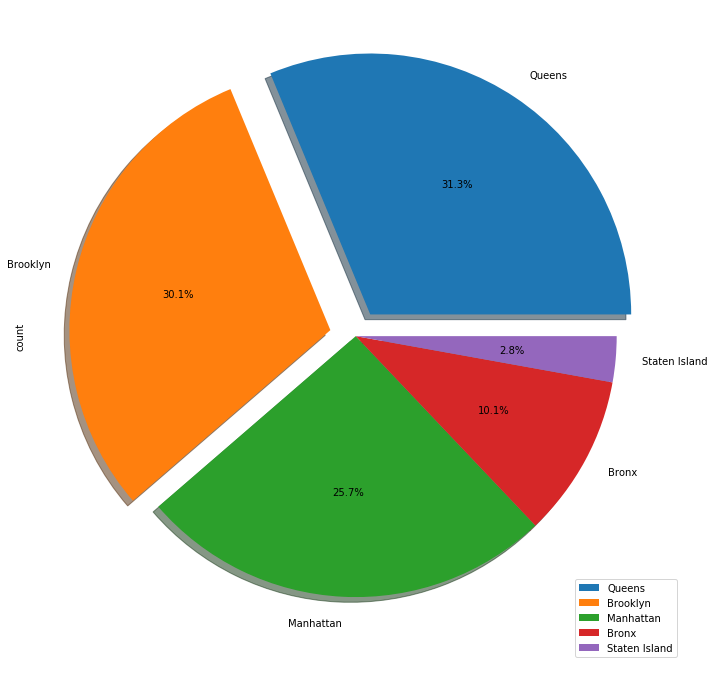

In [192]:
my_explode = (0.1, 0.1, 0,0,0)
pie_plot = df_count.plot.pie(y='count', labels = df_count['Country'], figsize=(12, 12), explode = my_explode,shadow= True,autopct='%1.1f%%')
plt.legend(loc=4)


### As the tlabe shows above, Quees is borough that has most Chinese Restaurant, and Brooklyn is the second. So those two neighborhoods worth to investigate, and compare to see which neighborhood is best for new restaurant.

In [193]:
!wget -q -O 'newyork_data.json' https://cocl.us/new_york_dataset
print('Data downloaded!')

with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

Data downloaded!


In [194]:
neighborhoods_data = newyork_data['features']

In [195]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

In [196]:
#Creating an empty dataframe for NYC
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude' ]

# instantiating the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [197]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [198]:
neighborhoods

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


In [199]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [200]:
# creating map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=10)

# adding markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork)  
    
map_newyork

In [201]:
CLIENT_ID = 'JR1TAHUBFBGGE1TNTW2GZ5K4QVRFQPXLN0TKPHUPIT1HTR3D' # your Foursquare ID
CLIENT_SECRET = 'KSSVGAJQVN2FKI2BOOZAMHUS4JU3OQV14SDTTBG0SA3CPXLB' # your Foursquare Secret
VERSION = '20200330'
LIMIT = 30
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)


Your credentails:
CLIENT_ID: JR1TAHUBFBGGE1TNTW2GZ5K4QVRFQPXLN0TKPHUPIT1HTR3D
CLIENT_SECRET:KSSVGAJQVN2FKI2BOOZAMHUS4JU3OQV14SDTTBG0SA3CPXLB


In [202]:
Neigh = neighborhoods[neighborhoods['Borough'].str.contains("Brooklyn|Queens")].reset_index(drop=True)
Neigh

,Borough,Neighborhood,Latitude,Longitude
0,Brooklyn,Bay Ridge,40.625801,-74.030621
1,Brooklyn,Bensonhurst,40.611009,-73.995180
2,Brooklyn,Sunset Park,40.645103,-74.010316
3,Brooklyn,Greenpoint,40.730201,-73.954241
4,Brooklyn,Gravesend,40.595260,-73.973471
5,Brooklyn,Brighton Beach,40.576825,-73.965094
6,Brooklyn,Sheepshead Bay,40.586890,-73.943186
7,Brooklyn,Manhattan Terrace,40.614433,-73.957438
8,Brooklyn,Flatbush,40.636326,-73.958401
9,Brooklyn,Crown Heights,40.670829,-73.943291


In [203]:
adress = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of NYC are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of NYC are 40.7127281, -74.0060152.


In [204]:
# creating map of NYC using latitude and longitude values
map_Restaruant = folium.Map(location=[latitude, longitude], zoom_start=11)

# adding markers to map
for lat, lng, label in zip(Neigh['Latitude'], Neigh['Longitude'], Neigh['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Restaruant)  
    
map_Restaruant

In [205]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']


In [206]:
Neigh.loc[0, 'Neighborhood']

'Bay Ridge'

In [207]:
neighborhood_latitude = Neigh.loc[0, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = Neigh.loc[0, 'Longitude'] # neighborhood longitude value

neighborhood_name = Neigh.loc[0, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Bay Ridge are 40.625801065010656, -74.03062069353813.


In [208]:
# type your answer here


LIMIT = 1000 # limit of number of venues returned by Foursquare API



radius = 5000 # define radius



 # create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url # display URL


'https://api.foursquare.com/v2/venues/explore?&client_id=JR1TAHUBFBGGE1TNTW2GZ5K4QVRFQPXLN0TKPHUPIT1HTR3D&client_secret=KSSVGAJQVN2FKI2BOOZAMHUS4JU3OQV14SDTTBG0SA3CPXLB&v=20200330&ll=40.625801065010656,-74.03062069353813&radius=5000&limit=1000'

In [209]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5e77a3dec8cff2001b8ee3c8'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'},
    {'name': '$-$$$$', 'key': 'price'}]},
  'headerLocation': 'Brooklyn',
  'headerFullLocation': 'Brooklyn',
  'headerLocationGranularity': 'city',
  'totalResults': 234,
  'suggestedBounds': {'ne': {'lat': 40.6708011100107,
    'lng': -73.97144109381662},
   'sw': {'lat': 40.58080102001061, 'lng': -74.08980029325963}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4ad09cf7f964a520bed820e3',
       'name': 'Bagel Boy',
       'location': {'address': '8002 3rd Ave',
        'crossStreet': '80th St',
        'lat': 40.627896,
        'lng': -74.029335,
        'labeledLatLngs': [{'label': 'di

In [210]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Bagel Boy,Bagel Shop,40.627896,-74.029335
1,Pilo Arts Day Spa and Salon,Spa,40.624748,-74.030591
2,Pegasus Cafe,Breakfast Spot,40.623168,-74.031186
3,Ho' Brah Taco Joint,Taco Place,40.622960,-74.031371
4,Peppino's,Pizza Place,40.629851,-74.028481


In [211]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [212]:
NYC_venues = getNearbyVenues(names=Neigh['Neighborhood'],
                                   latitudes=Neigh['Latitude'],
                                   longitudes=Neigh['Longitude']
                                  )


Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Astoria
Woodside
Jackson Heights
Elmhurst
Howard Beach
Corona
Forest Hills
Kew Gardens
Richmond Hill
Flushing
Long Island City
Sunnyside
East Elmhurst
Maspeth
Ridgewood
Glendale
Rego Park
Woodhaven
Ozone Park
South Ozone Park
College Point
Whitestone
Bayside
Auburndale
Little Neck
Douglaston
Glen Oa

In [213]:
print(NYC_venues.shape)
NYC_venues.head()

(4908, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bay Ridge,40.625801,-74.030621,Pilo Arts Day Spa and Salon,40.624748,-74.030591,Spa
1,Bay Ridge,40.625801,-74.030621,Bagel Boy,40.627896,-74.029335,Bagel Shop
2,Bay Ridge,40.625801,-74.030621,Leo's Casa Calamari,40.624200,-74.030931,Pizza Place
3,Bay Ridge,40.625801,-74.030621,Cocoa Grinder,40.623967,-74.030863,Juice Bar
4,Bay Ridge,40.625801,-74.030621,Pegasus Cafe,40.623168,-74.031186,Breakfast Spot


In [214]:
NYC_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Arverne,17,17,17,17,17,17
Astoria,100,100,100,100,100,100
Astoria Heights,12,12,12,12,12,12
Auburndale,20,20,20,20,20,20
Bath Beach,48,48,48,48,48,48
Bay Ridge,87,87,87,87,87,87
Bay Terrace,38,38,38,38,38,38
Bayside,75,75,75,75,75,75
Bayswater,3,3,3,3,3,3


In [215]:
# one hot encoding
NYC_onehot = pd.get_dummies(NYC_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
NYC_onehot['Neighborhood'] = NYC_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [NYC_onehot.columns[-1]] + list(NYC_onehot.columns[:-1])
NYC_onehot = NYC_onehot[fixed_columns]

NYC_onehot.head()

,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Basketball Court,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Piercing Parlor,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Post Office,Print Shop,Pub,Racetrack,Ramen Restaurant,Record Shop,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,Rock Club,Romanian Restaurant,Roof Deck,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout

In [216]:
NYC_grouped = NYC_onehot.groupby('Neighborhood').mean().reset_index()
NYC_grouped

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,Airport Terminal,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bath House,Beach,Beach Bar,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cha Chaan Teng,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Basketball Court,College Stadium,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Egyptian Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Ethiopian Restaurant,Event Service,Event Space,Eye Doctor,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Nightlife,Other Repair Shop,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pier,Piercing Parlor,Pilates Studio,Pizza Place,Platform,Playground,Plaza,Poke Place,Polish Restaurant,Pool,Pool Hall,Post Office,Print Shop,Pub,Racetrack,Ramen Restaurant,Record Shop,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Resort,Rest Area,Restaurant,Rock Club,Romanian Restaurant,Roof Deck,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout

In [217]:
num_top_venues = 5

for hood in NYC_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = NYC_grouped[NYC_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Arverne----
            venue  freq
0       Surf Spot  0.24
1  Sandwich Place  0.12
2   Metro Station  0.12
3           Beach  0.06
4      Playground  0.06


----Astoria----
                       venue  freq
0                        Bar  0.07
1           Greek Restaurant  0.05
2  Middle Eastern Restaurant  0.05
3                 Hookah Bar  0.05
4         Seafood Restaurant  0.04


----Astoria Heights----
           venue  freq
0  Deli / Bodega  0.08
1     Playground  0.08
2    Bus Station  0.08
3  Bowling Alley  0.08
4    Supermarket  0.08


----Auburndale----
                    venue  freq
0      Italian Restaurant  0.10
1      Athletics & Sports  0.05
2      Miscellaneous Shop  0.05
3  Furniture / Home Store  0.05
4        Toy / Game Store  0.05


----Bath Beach----
                  venue  freq
0    Chinese Restaurant  0.08
1              Pharmacy  0.06
2      Sushi Restaurant  0.04
3  Fast Food Restaurant  0.04
4           Gas Station  0.04


----Bay Ridge----
              

                 venue  freq
0           Donut Shop  0.18
1  Indie Movie Theater  0.09
2          Gas Station  0.09
3          Coffee Shop  0.09
4                 Lake  0.09


----East Flatbush----
              venue  freq
0  Department Store   0.1
1          Pharmacy   0.1
2        Print Shop   0.1
3     Moving Target   0.1
4       Supermarket   0.1


----East New York----
                  venue  freq
0         Deli / Bodega  0.19
1    Chinese Restaurant  0.12
2           Pizza Place  0.06
3    Spanish Restaurant  0.06
4  Caribbean Restaurant  0.06


----East Williamsburg----
           venue  freq
0            Bar  0.08
1  Deli / Bodega  0.07
2    Coffee Shop  0.05
3         Bakery  0.05
4   Cocktail Bar  0.05


----Edgemere----
           venue  freq
0  Metro Station  0.14
1    Pizza Place  0.14
2  Deli / Bodega  0.07
3          Hotel  0.07
4           Park  0.07


----Elmhurst----
                       venue  freq
0            Thai Restaurant  0.18
1         Mexican Restaurant  

                venue  freq
0               Hotel  0.11
1         Coffee Shop  0.11
2  Mexican Restaurant  0.05
3         Pizza Place  0.05
4                 Bar  0.05


----Madison----
                venue  freq
0          Bagel Shop   0.2
1        Dessert Shop   0.1
2  Italian Restaurant   0.1
3       Deli / Bodega   0.1
4                 Spa   0.1


----Malba----
                       venue  freq
0               Tennis Court  0.33
1  Latin American Restaurant  0.33
2                  Rest Area  0.33
3                Yoga Studio  0.00
4                Opera House  0.00


----Manhattan Beach----
            venue  freq
0            Café  0.22
1           Beach  0.11
2  Ice Cream Shop  0.11
3  Sandwich Place  0.11
4            Food  0.11


----Manhattan Terrace----
                 venue  freq
0          Pizza Place  0.12
1           Donut Shop  0.12
2       Ice Cream Shop  0.08
3  Japanese Restaurant  0.04
4         Burger Joint  0.04


----Marine Park----
              venue  freq


                venue  freq
0        Dessert Shop  0.12
1  Turkish Restaurant  0.12
2      Sandwich Place  0.08
3         Yoga Studio  0.04
4              Buffet  0.04


----Somerville----
                   venue  freq
0                   Park   1.0
1            Opera House   0.0
2   Pakistani Restaurant   0.0
3           Outlet Store   0.0
4  Outdoors & Recreation   0.0


----South Jamaica----
                  venue  freq
0           Bus Station  0.25
1         Deli / Bodega  0.12
2                Bakery  0.12
3  Caribbean Restaurant  0.12
4         Grocery Store  0.12


----South Ozone Park----
                  venue  freq
0                  Park  0.27
1  Fast Food Restaurant  0.18
2         Deli / Bodega  0.09
3                   Bar  0.09
4            Food Truck  0.09


----South Side----
                 venue  freq
0                  Bar  0.07
1          Pizza Place  0.06
2          Coffee Shop  0.05
3             Wine Bar  0.04
4  American Restaurant  0.04


----Springfield G

In [218]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [219]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = NYC_grouped['Neighborhood']

for ind in np.arange(NYC_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(NYC_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Arverne,Surf Spot,Sandwich Place,Metro Station,Coffee Shop,Board Shop,Bus Stop,Beach,Thai Restaurant,Donut Shop,Playground
1,Astoria,Bar,Middle Eastern Restaurant,Greek Restaurant,Hookah Bar,Seafood Restaurant,Café,Indian Restaurant,Mediterranean Restaurant,Deli / Bodega,Grocery Store
2,Astoria Heights,Deli / Bodega,Food,Bakery,Supermarket,Bus Station,Bowling Alley,Burger Joint,Italian Restaurant,Hostel,Pizza Place
3,Auburndale,Italian Restaurant,Korean Restaurant,Pet Store,Sushi Restaurant,Noodle House,Supermarket,Bar,Fast Food Restaurant,Toy / Game Store,Train
4,Bath Beach,Chinese Restaurant,Pharmacy,Sushi Restaurant,Gas Station,Bubble Tea Shop,Italian Restaurant,Fast Food Restaurant,Cantonese Restaurant,Surf Spot,Bike Rental / Bike Share


In [220]:
# set number of clusters
kclusters = 5

NYC_grouped_clustering = NYC_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(NYC_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2], dtype=int32)

In [221]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

NYC_merged = Neigh

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
NYC_merged = NYC_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
print(NYC_merged.shape)
NYC_merged

(151, 15)


,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Brooklyn,Bay Ridge,40.625801,-74.030621,2,Italian Restaurant,Spa,Pizza Place,Greek Restaurant,Bar,American Restaurant,Chinese Restaurant,New American Restaurant,Thai Restaurant,Middle Eastern Restaurant
1,Brooklyn,Bensonhurst,40.611009,-73.995180,2,Chinese Restaurant,Pizza Place,Sushi Restaurant,Ice Cream Shop,Bakery,Donut Shop,Italian Restaurant,Cosmetics Shop,Coffee Shop,Bagel Shop
2,Brooklyn,Sunset Park,40.645103,-74.010316,2,Pizza Place,Bakery,Latin American Restaurant,Mexican Restaurant,Bank,Mobile Phone Shop,Pharmacy,Deli / Bodega,Fried Chicken Joint,Gym
3,Brooklyn,Greenpoint,40.730201,-73.954241,2,Bar,Pizza Place,Coffee Shop,Cocktail Bar,Yoga Studio,Sushi Restaurant,Mexican Restaurant,French Restaurant,Record Shop,Café
4,Brooklyn,Gravesend,40.595260,-73.973471,2,Pizza Place,Chinese Restaurant,Italian Restaurant,Lounge,Bus Station,Martial Arts Dojo,Bakery,Donut Shop,Liquor Store,Gym
5,Brooklyn,Brighton Beach,40.576825,-73.965094,2,Beach,Russian Restaurant,Restaurant,Eastern European Restaurant,Pharmacy,Mobile Phone Shop,Bank,Gourmet Shop,Sushi Restaurant,Non-Profit
6,Brooklyn,Sheepshead Bay,40.586890,-73.943186,2,Turkish Restaurant,Dessert Shop,Sandwich Place,Yoga Studio,Miscellaneous Shop,Boat or Ferry,Café,Russian Restaurant,Buffet,Outlet Store
7,Brooklyn,Manhattan Terrace,40.614433,-73.957438,2,Donut Shop,Pizza Place,Ice Cream Shop,Mobile Phone Shop,Metro Station,Steakhouse,Organic Grocery,Chinese Restaurant,Liquor Store,Coffee Shop
8,Brooklyn,Flatbush,40.636326,-73.958401,0,Deli / Bodega,Mexican Restaurant,Caribbean Restaurant,Coffee Shop,Plaza,Donut Shop,Middle Eastern Restaurant,Lounge,Sandwich Place,Bank
9,Brooklyn,Crown Heights,40.670829,-73.943291,2,Pizza Place,Museum,Café,Playground,Coffee Shop,Deli / Bodega,Fried Chicken Joint,Bookstore,Supermarket,Candy Store


In [401]:
Cluster_Manage = NYC_merged.drop(columns = ['Borough','Neighborhood','Latitude','Longitude'])
#Cluster_Manage.set_index(["Person", "Single"]).count(level="Person")
Cluster_Manage.head()

,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2,Italian Restaurant,Spa,Pizza Place,Greek Restaurant,Bar,American Restaurant,Chinese Restaurant,New American Restaurant,Thai Restaurant,Middle Eastern Restaurant
1,2,Chinese Restaurant,Pizza Place,Sushi Restaurant,Ice Cream Shop,Bakery,Donut Shop,Italian Restaurant,Cosmetics Shop,Coffee Shop,Bagel Shop
2,2,Pizza Place,Bakery,Latin American Restaurant,Mexican Restaurant,Bank,Mobile Phone Shop,Pharmacy,Deli / Bodega,Fried Chicken Joint,Gym
3,2,Bar,Pizza Place,Coffee Shop,Cocktail Bar,Yoga Studio,Sushi Restaurant,Mexican Restaurant,French Restaurant,Record Shop,Café
4,2,Pizza Place,Chinese Restaurant,Italian Restaurant,Lounge,Bus Station,Martial Arts Dojo,Bakery,Donut Shop,Liquor Store,Gym


In [223]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(NYC_merged['Latitude'], NYC_merged['Longitude'], NYC_merged['Neighborhood'], NYC_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

,Cluster 0,cluster2
Deli / Bodega,0.080952,0.023622
Chinese Restaurant,0.057143,0.026772
Donut Shop,0.042857,0.029921
Factory,0.028571,0.010236
Supermarket,0.028571,0.015748
Gym,0.028571,0.007874
Fast Food Restaurant,0.028571,0.019685
Pizza Place,0.028571,0.050394
Caribbean Restaurant,0.023810,0.014173
Mexican Restaurant,0.023810,0.013386


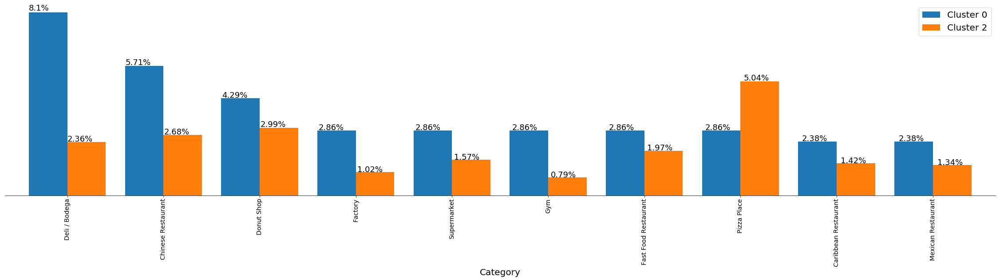

In [544]:
cluster0 = Cluster_Manage[Cluster_Manage['Cluster Labels']== 0].reset_index(drop=True)
cluster0 = cluster0.apply(pd.value_counts,axis=0) 
cluster0.drop([0],inplace= True)

#cluster0.index.name = 'Category'
#cluster0 = cluster0.reset_index()

cluster0 ['Total'] = cluster0 .sum(axis=1)
cluster0 ['Cluster 0'] = cluster0 ['Total']/ cluster0 ['Total'].sum()
cluster0 = cluster0 [['Cluster 0']].sort_values(by=['Cluster 0'],ascending=False )

cluster2 = Cluster_Manage[Cluster_Manage['Cluster Labels']== 2].reset_index(drop=True)
cluster2 = cluster2.apply(pd.value_counts,axis=0) 
cluster2.drop([2],inplace= True)

#cluster2.index.name = 'Category'
#cluster2 = cluster2.reset_index()

cluster2 ['Total'] = cluster2 .sum(axis=1)
cluster2 ['cluster2'] = cluster2 ['Total']/ cluster2 ['Total'].sum()
cluster2 = cluster2 [['cluster2']].sort_values(by=['cluster2'],ascending=False )


# Merge two Dataframes on index of both the dataframes
Cluster_merge = cluster0.merge(cluster2, left_index=True, right_index=True)


cluster_ax = Cluster_merge.head(10).plot(kind = 'bar', figsize = (40,8), width = 0.8)
plt.rc('font',size =18)


cluster0_ax.set_title('Venue Ratio in Different Cluster', fontsize=25)

cluster_ax.yaxis.set_visible(False)
cluster_ax.set_xlabel("Category", fontsize=20)
cluster_ax.legend(["Cluster 0",'Cluster 2'],fontsize=20)
cluster_ax.spines['left'].set_visible(False)
cluster_ax.spines['right'].set_visible(False)
cluster_ax.spines['top'].set_visible(False)

for i in cluster_ax.patches:

    cluster_ax.annotate(str((i.get_height()*100).round(2))+'%', (i.get_x() * 1.005, i.get_height() * 1.01))



Cluster_merge.head(20)

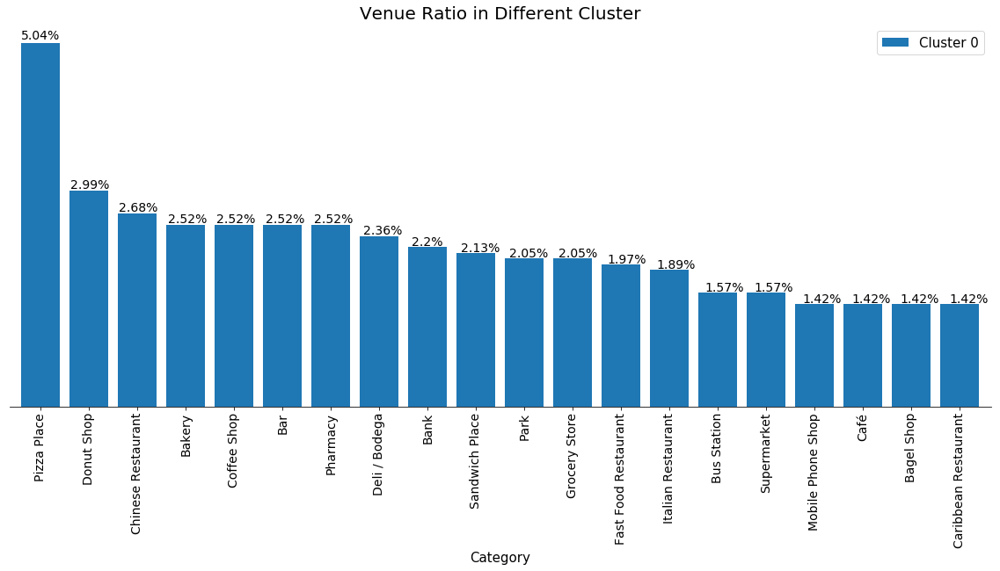

In [521]:


cluster2 = Cluster_Manage[Cluster_Manage['Cluster Labels']== 2].reset_index(drop=True)
cluster2 = cluster2.apply(pd.value_counts,axis=0) 
cluster2.drop([2],inplace= True)

#cluster2.index.name = 'Category'
#cluster2 = cluster2.reset_index()

cluster2 ['Total'] = cluster2 .sum(axis=1)
cluster2 ['Venue Ratio'] = cluster2 ['Total']/ cluster2 ['Total'].sum()
cluster2 = cluster2 [['Venue Ratio']].sort_values(by=['Venue Ratio'],ascending=False )



cluster2_ax = cluster2.head(20).plot(kind = 'bar', figsize = (20,8), width = 0.8)
plt.rc('font',size =14)
plt.title('Percentage of the Respondents Interest in the Different Data Science Area ', size=16) 

cluster2_ax.set_title('Venue Ratio in Different Cluster', fontsize=20)

cluster2_ax.yaxis.set_visible(False)
cluster2_ax.set_xlabel("Category", fontsize=15)
cluster2_ax.legend(["Cluster 2"],fontsize=15)
cluster2_ax.spines['left'].set_visible(False)
cluster2_ax.spines['right'].set_visible(False)
cluster2_ax.spines['top'].set_visible(False)

for i in cluster2_ax.patches:

    cluster2_ax.annotate(str((i.get_height()*100).round(2))+'%', (i.get_x() * 1.01, i.get_height() * 1.01))



In [230]:
NYC_merged2 = NYC_merged[NYC_merged['1st Most Common Venue'].str.contains("Chinese")].reset_index(drop=True)
NYC_merged2

,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Brooklyn,Bensonhurst,40.611009,-73.995180,2,Chinese Restaurant,Pizza Place,Sushi Restaurant,Ice Cream Shop,Bakery,Donut Shop,Italian Restaurant,Cosmetics Shop,Coffee Shop,Bagel Shop
1,Brooklyn,Bath Beach,40.599519,-73.998752,2,Chinese Restaurant,Pharmacy,Sushi Restaurant,Gas Station,Bubble Tea Shop,Italian Restaurant,Fast Food Restaurant,Cantonese Restaurant,Surf Spot,Bike Rental / Bike Share
2,Queens,Corona,40.742382,-73.856825,0,Chinese Restaurant,Mexican Restaurant,Italian Restaurant,Empanada Restaurant,Sandwich Place,Supermarket,Bakery,Park,Restaurant,Juice Bar
3,Queens,Kew Gardens,40.705179,-73.829819,2,Chinese Restaurant,Donut Shop,Pizza Place,Bank,Bar,Pet Store,Cosmetics Shop,Park,Indian Restaurant,Bakery
4,Queens,Beechhurst,40.792781,-73.804365,0,Chinese Restaurant,Yoga Studio,Italian Restaurant,Supermarket,Optical Shop,Gym / Fitness Center,Donut Shop,Restaurant,Gym,Deli / Bodega
5,Queens,Queensboro Hill,40.744572,-73.825809,2,Chinese Restaurant,Bank,Bakery,Frozen Yogurt Shop,Bagel Shop,Pizza Place,Cosmetics Shop,Park,Dumpling Restaurant,Cantonese Restaurant
6,Queens,Ravenswood,40.761705,-73.931575,2,Chinese Restaurant,Greek Restaurant,Spanish Restaurant,Sushi Restaurant,Liquor Store,Taco Place,Market,Food & Drink Shop,Latin American Restaurant,Grocery Store
7,Queens,Lindenwood,40.663918,-73.849638,0,Chinese Restaurant,Japanese Restaurant,Liquor Store,Grocery Store,Gym,Bank,Bakery,Donut Shop,Fruit & Vegetable Store,Pharmacy
8,Brooklyn,New Lots,40.662744,-73.885118,2,Chinese Restaurant,Pharmacy,Fried Chicken Joint,Pizza Place,Grocery Store,Breakfast Spot,Furniture / Home Store,Metro Station,Bank,Park
9,Brooklyn,Mill Basin,40.615974,-73.915154,2,Chinese Restaurant,Pizza Place,Bank,Cosmetics Shop,Bagel Shop,Japanese Restaurant,Bus Station,Grocery Store,Gym,Frozen Yogurt Shop


In [545]:
NYC_merged3 = NYC_merged2[['Cluster Labels','Borough','Neighborhood']]
NYC_merged3

,Cluster Labels,Borough,Neighborhood
0,2,Brooklyn,Bensonhurst
1,2,Brooklyn,Bath Beach
2,0,Queens,Corona
3,2,Queens,Kew Gardens
4,0,Queens,Beechhurst
5,2,Queens,Queensboro Hill
6,2,Queens,Ravenswood
7,0,Queens,Lindenwood
8,2,Brooklyn,New Lots
9,2,Brooklyn,Mill Basin


In [547]:

# create map
map_Restaruant_2 = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(NYC_merged2['Latitude'], NYC_merged2['Longitude'], NYC_merged2['Neighborhood'], NYC_merged2['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_Restaruant_2)
       
map_Restaruant_2


In [233]:
population =requests.get("https://www.health.ny.gov/statistics/cancer/registry/appendix/neighborhoodpop.htm")
population

<Response [200]>

In [234]:
url = "https://www.health.ny.gov/statistics/cancer/registry/appendix/neighborhoodpop.htm"
population2 =pd.read_html(url, header=0)[0]
population2.head()


,Borough,region,Males,Females,Total Population
0,Bronx,"Riverdale, Fieldston & Kingsbridge",51598,61481,113079
1,NaN,"Wakefield, Williamsbridge & Woodlawn",65216,78387,143604
2,NaN,"Co-op City, Pelham Bay & Schuylerville",55037,65204,120241
3,NaN,"Pelham Parkway, Morris Park & Laconia",60974,67982,128956
4,NaN,"Belmont, Crotona Park East & East Tremont",77119,89293,166411


In [235]:
population3 = population2[['region','Total Population']].sort_values(by=['Total Population'])
population3

,region,Total Population
20,"Crown Heights So., Prospect Lefferts & Wingate",111518
14,"Park Slope, Carroll Gardens & Red Hook",111871
0,"Riverdale, Fieldston & Kingsbridge",113079
45,Forest Hills & Rego Park,117027
51,"Far Rockaway, Breezy Point & Broad Channel",119043
27,Brighton Beach & Coney Island,119550
2,"Co-op City, Pelham Bay & Schuylerville",120241
31,East Harlem,120435
41,"Bayside, Douglaston & Little Neck",121623
30,Central Harlem,121701


In [236]:
# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013

import requests

NYC_map= folium.Map(location=[40.7128, -74.0060], zoom_start=12)
NYC_map.choropleth(
    geo_data=newyork_data,
    data=population3,
    columns=['region', 'Total Population'],
    key_on='feature.properties',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population in NYC'
)

# display map
NYC_map

/opt/conda/envs/Python36/lib/python3.6/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


TypeError: unhashable type: 'dict'